Normalizing layer: counts.shNC

Normalizing layer: counts.shmmp9-1

Normalizing layer: counts.shmmp9-3

Finding variable features for layer counts.shNC

Finding variable features for layer counts.shmmp9-1

Finding variable features for layer counts.shmmp9-3

Centering and scaling data matrix



49.21 sec elapsed


Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



127.04 sec elapsed


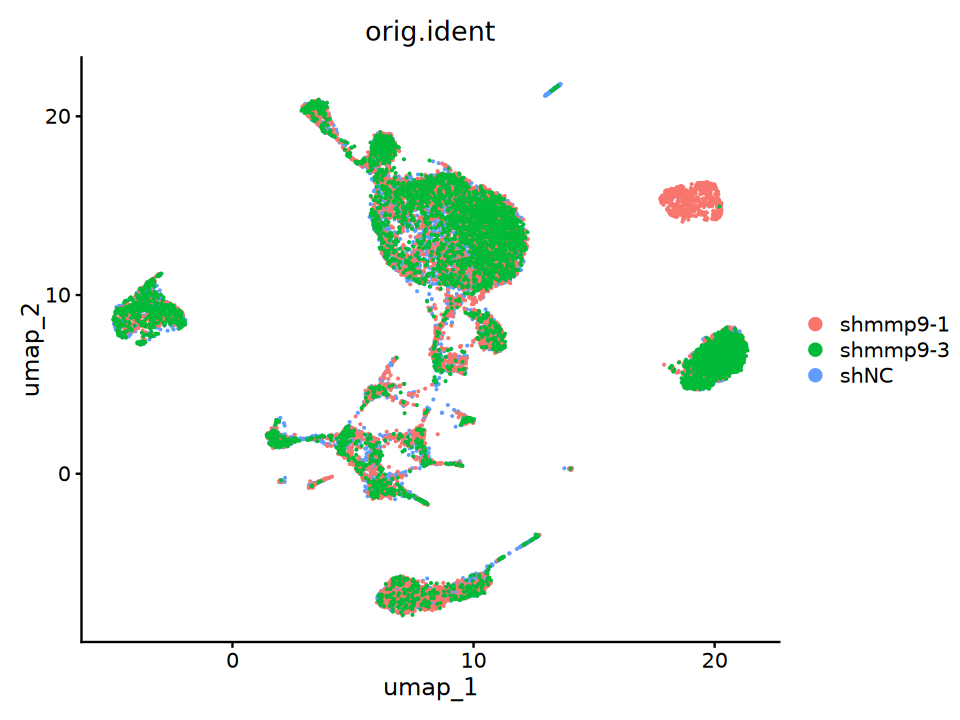

In [1]:
# 清空环境和设置随机种子
rm(list = ls())
set.seed(1234)
options(future.seed = TRUE)
Sys.setenv(RETICULATE_PYTHON = "/home/gonglihao/miniconda3/envs/42/bin/python")
suppressPackageStartupMessages({
    library("dplyr")
    library("Matrix")
    library("Seurat")
    library("future.apply")
    library("tictoc")
    library("ggplot2")
    library("ggpubr")
    library("future")
    library("COSG")
    library("harmony")
    library("parallel")
    library("patchwork")
})

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)

# 读取数据
shNC_singlet <- readRDS("/data3/Group8/gonglihao/1-MMP9/1-QC/shNC-singlet.rds")
shmmp9_1_singlet <- readRDS("/data3/Group8/gonglihao/1-MMP9/1-QC/sh1-singlet.rds")
shmmp9_3_singlet <- readRDS("/data3/Group8/gonglihao/1-MMP9/1-QC/sh3-singlet.rds")

# 合并数据集并将对象命名为seu
seu <- merge(x = shNC_singlet,
            y = list(shmmp9_1_singlet, shmmp9_3_singlet),
            add.cell.ids = c("NC", "sh1", "sh3"),
            project = "Combined")

options(warn=-1)

# 数据标准化和特征选择
tic()
seu <- NormalizeData(seu, 
                    normalization.method = "LogNormalize",
                    scale.factor = 10000,
                    block.size = 800)

seu <- FindVariableFeatures(seu,
                          selection.method = "vst",
                          nfeatures = 2000)

plan("sequential")
seu <- ScaleData(seu,
                features = rownames(seu),
                block.size = 1000,
                min.cells.to.block = 1000)
plan("sequential")
toc()

# 降维分析
tic()
seu <- RunPCA(seu, npcs = 30, verbose = FALSE)

seu <- RunHarmony(seu,
                 group.by.vars = "orig.ident",
                 seed.use = 1234)

seu <- RunUMAP(seu,
              reduction = "harmony",
              dims = 1:30,
              umap.method = "umap-learn",
              metric = "correlation",
              verbose = FALSE)
toc()

# 可视化
options(repr.plot.width = 8, repr.plot.height = 6)
DimPlot(seu, reduction = "umap", group.by = "orig.ident")

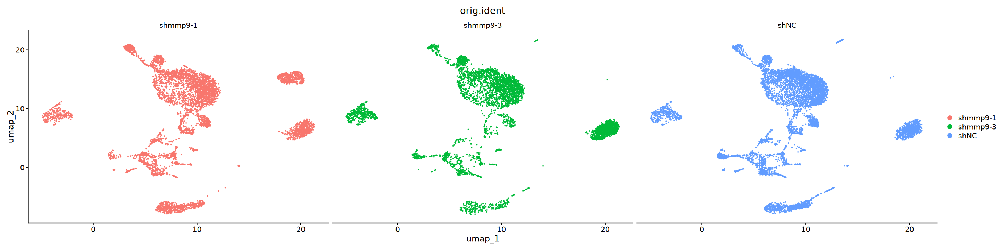

In [3]:
options(repr.plot.width = 24, repr.plot.height = 6)
DimPlot(seu, reduction = "umap", group.by = "orig.ident", split.by = "orig.ident")

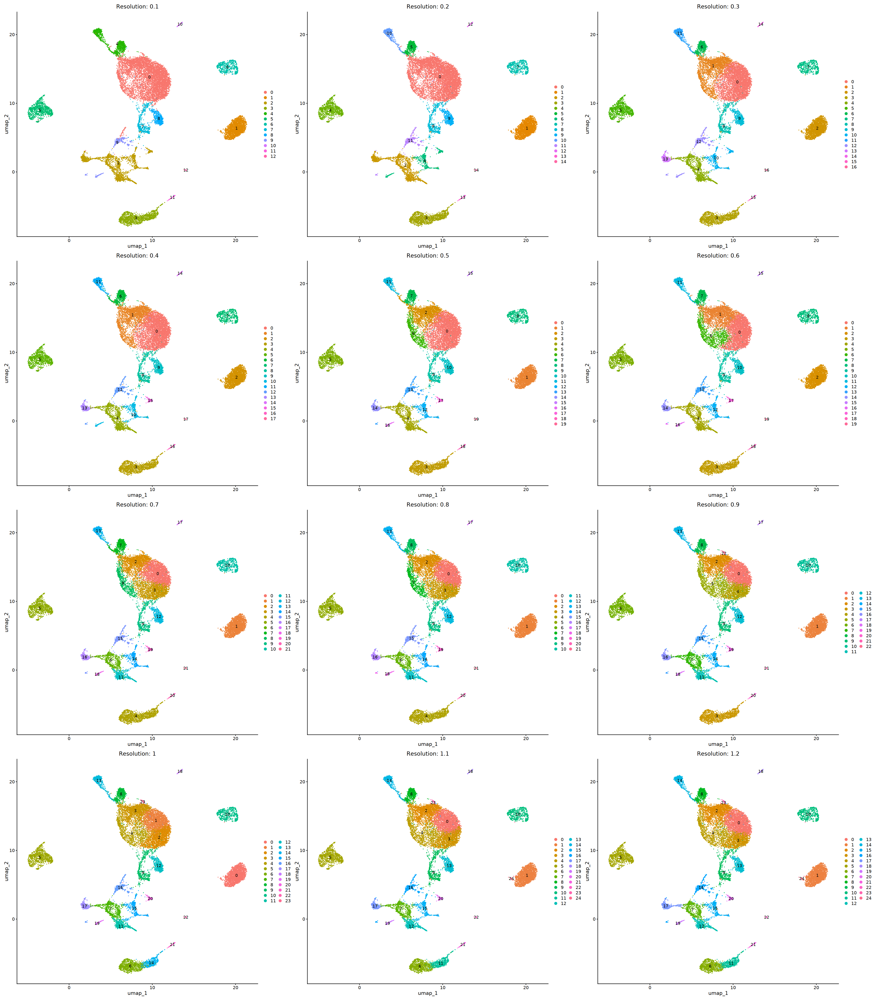

In [5]:
tic()
seu <- FindNeighbors(object = seu,
                    dims = 1:30,
                    verbose = FALSE, reduction = "harmony")
                         
resolution.range <- seq(0.1, 1.2, by = 0.1)
plot_list <- list()

for (res in resolution.range) {
    # 进行聚类
    seu <- FindClusters(seu,
        resolution = res,
        verbose = FALSE,
        random.seed = 1234)
    
    cluster_column <- paste0("RNA_snn_res.", res)
    
    p <- DimPlot(seu,
        reduction = "umap",
        group.by = cluster_column,
        label = TRUE,
        label.size = 4) +
        ggtitle(paste("Resolution:", res))
    
    plot_list[[length(plot_list) + 1]] <- p
}

options(repr.plot.width = 35, repr.plot.height = 40)
wrap_plots(plot_list, ncol = 3)  # 每行显示3个图

In [8]:
saveRDS(seu, file="/data3/Group8/gonglihao/1-MMP9/1-QC/combined-all.rds")

19 Mast cells
18Neutrophils
17CDC1
16 DC
15 Hepatocytes

In [2]:
seu<- subset(seu, subset=RNA_snn_res.0.6!=19 &RNA_snn_res.0.6!=18 &RNA_snn_res.0.6!=16 &RNA_snn_res.0.6!=15)

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



58.429 sec elapsed


Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



138.868 sec elapsed


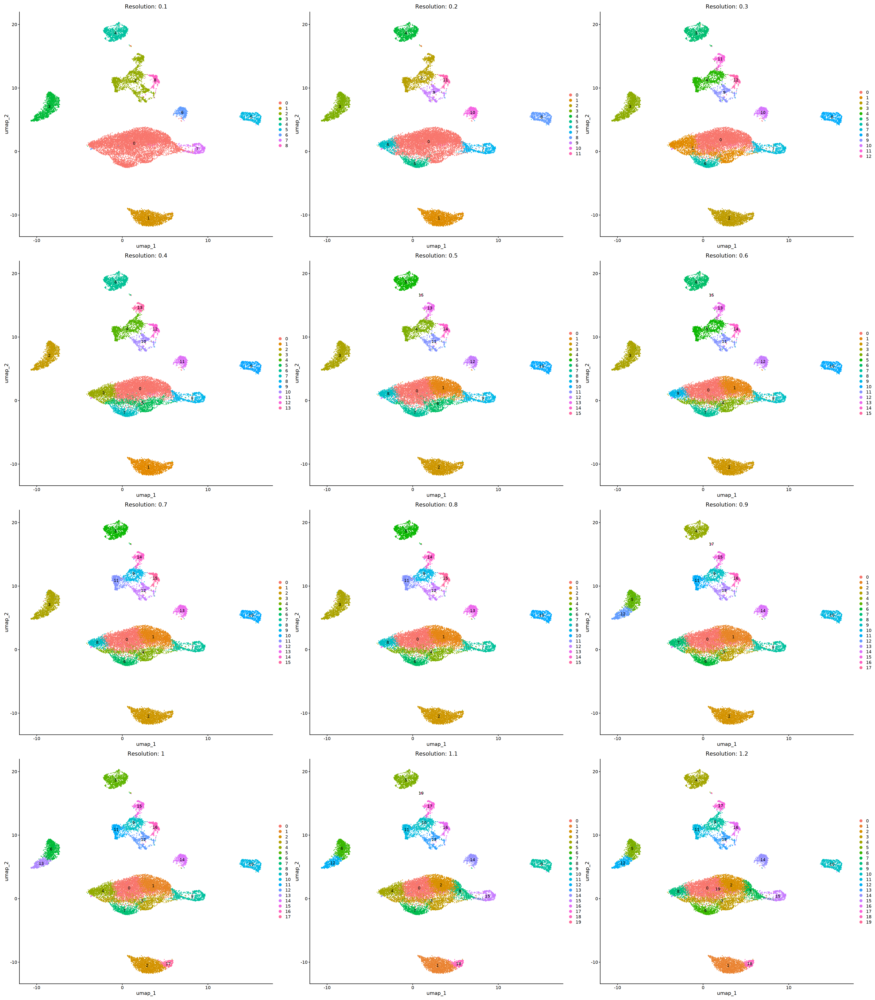

In [3]:
options(warn=-1)

# 数据标准化和特征选择
tic()
seu <- NormalizeData(seu, 
                    normalization.method = "LogNormalize",
                    scale.factor = 10000,
                    block.size = 800)

seu <- FindVariableFeatures(seu,
                          selection.method = "vst",
                          nfeatures = 2000)

plan("sequential")
seu <- ScaleData(seu,
                features = rownames(seu),
                block.size = 1000,
                min.cells.to.block = 1000)
plan("sequential")
toc()

# 降维分析
tic()
seu <- RunPCA(seu, npcs = 30, verbose = FALSE)

seu <- RunHarmony(seu,
                 group.by.vars = "orig.ident",
                 seed.use = 1234)

seu <- RunUMAP(seu,
              reduction = "harmony",
              dims = 1:30,
              umap.method = "umap-learn",
              metric = "correlation",
              verbose = FALSE)
toc()
seu <- FindNeighbors(object = seu,
                    dims = 1:30,
                    verbose = FALSE, reduction = "harmony")
                         
resolution.range <- seq(0.1, 1.2, by = 0.1)
plot_list <- list()

for (res in resolution.range) {
    # 进行聚类
    seu <- FindClusters(seu,
        resolution = res,
        verbose = FALSE,
        random.seed = 1234)
    
    cluster_column <- paste0("RNA_snn_res.", res)
    
    p <- DimPlot(seu,
        reduction = "umap",
        group.by = cluster_column,
        label = TRUE,
        label.size = 4) +
        ggtitle(paste("Resolution:", res))
    
    plot_list[[length(plot_list) + 1]] <- p
}

options(repr.plot.width = 35, repr.plot.height = 40)
wrap_plots(plot_list, ncol = 3)  # 每行显示3个图

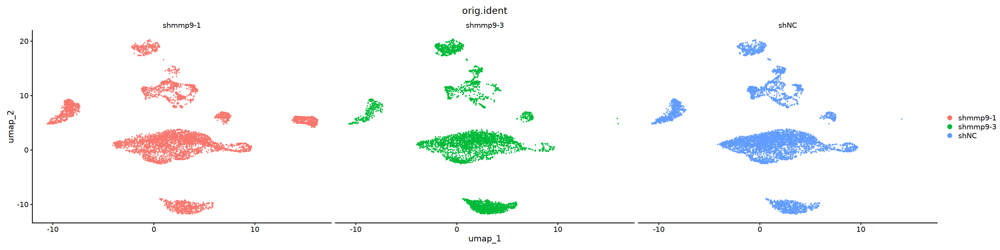

In [11]:
options(repr.plot.width = 24, repr.plot.height = 6)
DimPlot(seu, reduction = "umap", group.by = "orig.ident", split.by = "orig.ident")

In [12]:
output_path <- "/data3/Group8/gonglihao/1-MMP9/1-QC"
cluster_col <- "RNA_snn_res.0.5"
seu <- JoinLayers(seu)
Idents(seu) <- cluster_col

cosg_markers <- cosg(
   seu,
   groups = 'all',
   mu = 1
)

avg_expr <- AggregateExpression(
   seu,
   group.by = cluster_col,
   assays = "RNA"
)$RNA

cluster_vec <- rep(names(cosg_markers$names), sapply(cosg_markers$names, length))
genes_vec <- unlist(cosg_markers$names)
scores_vec <- unlist(cosg_markers$scores)

cosg_results_df <- data.frame(
   cluster = cluster_vec,
   Gene = genes_vec,
   Score = scores_vec,
   stringsAsFactors = FALSE
)

cluster_names <- paste0("g", cosg_results_df$cluster)
cosg_results_df$Avg_Expression <- NA

genes_match <- match(cosg_results_df$Gene, rownames(avg_expr))
clusters_match <- match(cluster_names, colnames(avg_expr))
valid_indices <- !is.na(genes_match) & !is.na(clusters_match)
cosg_results_df$Avg_Expression[valid_indices] <- round(
   avg_expr[cbind(
       genes_match[valid_indices], 
       clusters_match[valid_indices]
   )],
   3
)

cosg_results_df$cluster <- as.numeric(cosg_results_df$cluster)
cosg_results_df <- cosg_results_df[order(cosg_results_df$cluster, -cosg_results_df$Score),]

excel_data <- split(cosg_results_df, cosg_results_df$cluster)
excel_data <- lapply(excel_data, function(x) {
   x <- x[order(-x$Score),]
   x$cluster <- NULL
   return(x)
})
names(excel_data) <- paste0("Cluster", names(excel_data))

resolution <- sub(".*res\\.", "", cluster_col)

excel_filename <- paste0("sh-nc-cosg_markers-", resolution, ".xlsx")
csv_filename <- paste0("sh-nc-cosg_markers-", resolution, ".csv")

write_xlsx(excel_data, path = file.path(output_path, excel_filename))
data.table::fwrite(cosg_results_df, file = file.path(output_path, csv_filename))

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



39.753 sec elapsed


Transposing data matrix

Initializing state using k-means centroids initialization

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony converged after 3 iterations



94.145 sec elapsed


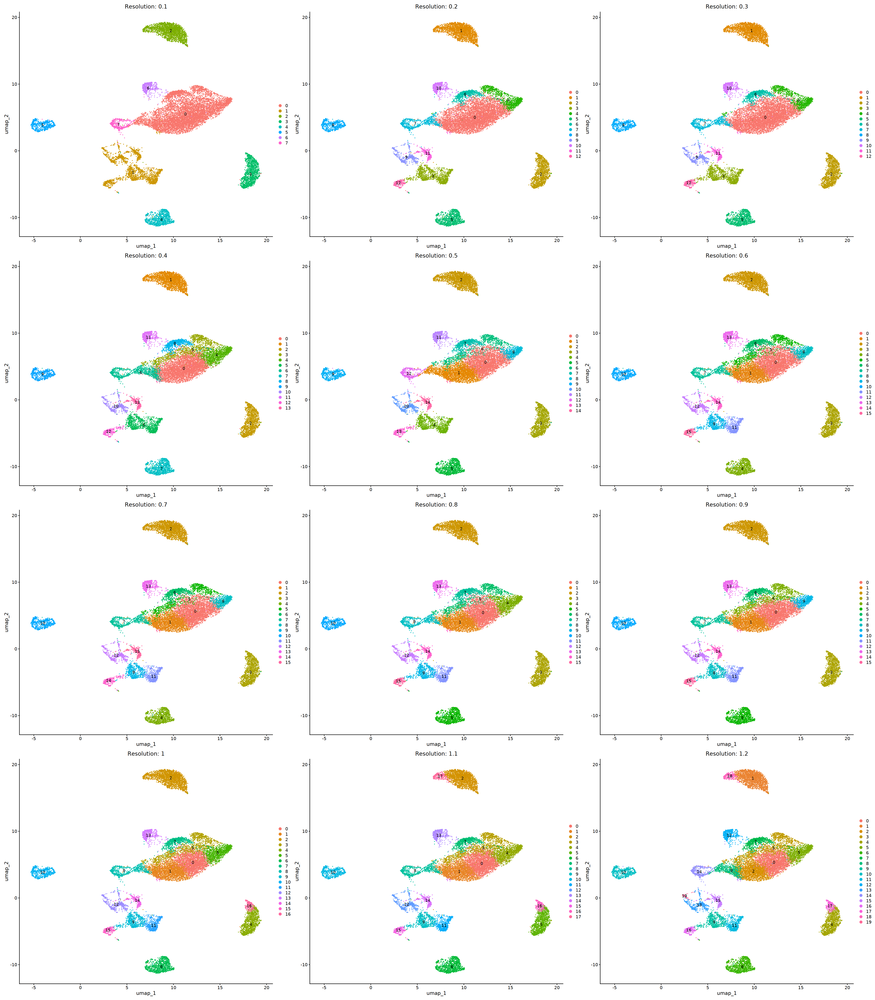

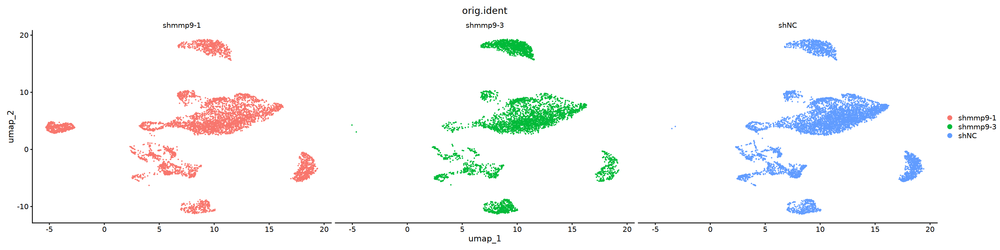

In [4]:
#C15 Hepatocytes
seu<- subset(seu, subset=RNA_snn_res.0.5!=15)

options(warn=-1)

# 数据标准化和特征选择
tic()
seu <- NormalizeData(seu, 
                    normalization.method = "LogNormalize",
                    scale.factor = 10000,
                    block.size = 800)

seu <- FindVariableFeatures(seu,
                          selection.method = "vst",
                          nfeatures = 2000)

plan("sequential")
seu <- ScaleData(seu,
                features = rownames(seu),
                block.size = 1000,
                min.cells.to.block = 1000)
plan("sequential")
toc()

# 降维分析
tic()
seu <- RunPCA(seu, npcs = 30, verbose = FALSE)

seu <- RunHarmony(seu,
                 group.by.vars = "orig.ident",
                 seed.use = 1234)

seu <- RunUMAP(seu,
              reduction = "harmony",
              dims = 1:30,
              umap.method = "umap-learn",
              metric = "correlation",
              verbose = FALSE)
toc()
seu <- FindNeighbors(object = seu,
                    dims = 1:30,
                    verbose = FALSE, reduction = "harmony")
                         
resolution.range <- seq(0.1, 1.2, by = 0.1)
plot_list <- list()

for (res in resolution.range) {
    # 进行聚类
    seu <- FindClusters(seu,
        resolution = res,
        verbose = FALSE,
        random.seed = 1234)
    
    cluster_column <- paste0("RNA_snn_res.", res)
    
    p <- DimPlot(seu,
        reduction = "umap",
        group.by = cluster_column,
        label = TRUE,
        label.size = 4) +
        ggtitle(paste("Resolution:", res))
    
    plot_list[[length(plot_list) + 1]] <- p
}

options(repr.plot.width = 35, repr.plot.height = 40)
wrap_plots(plot_list, ncol = 3)  # 每行显示3个图
options(repr.plot.width = 24, repr.plot.height = 6)
DimPlot(seu, reduction = "umap", group.by = "orig.ident", split.by = "orig.ident")

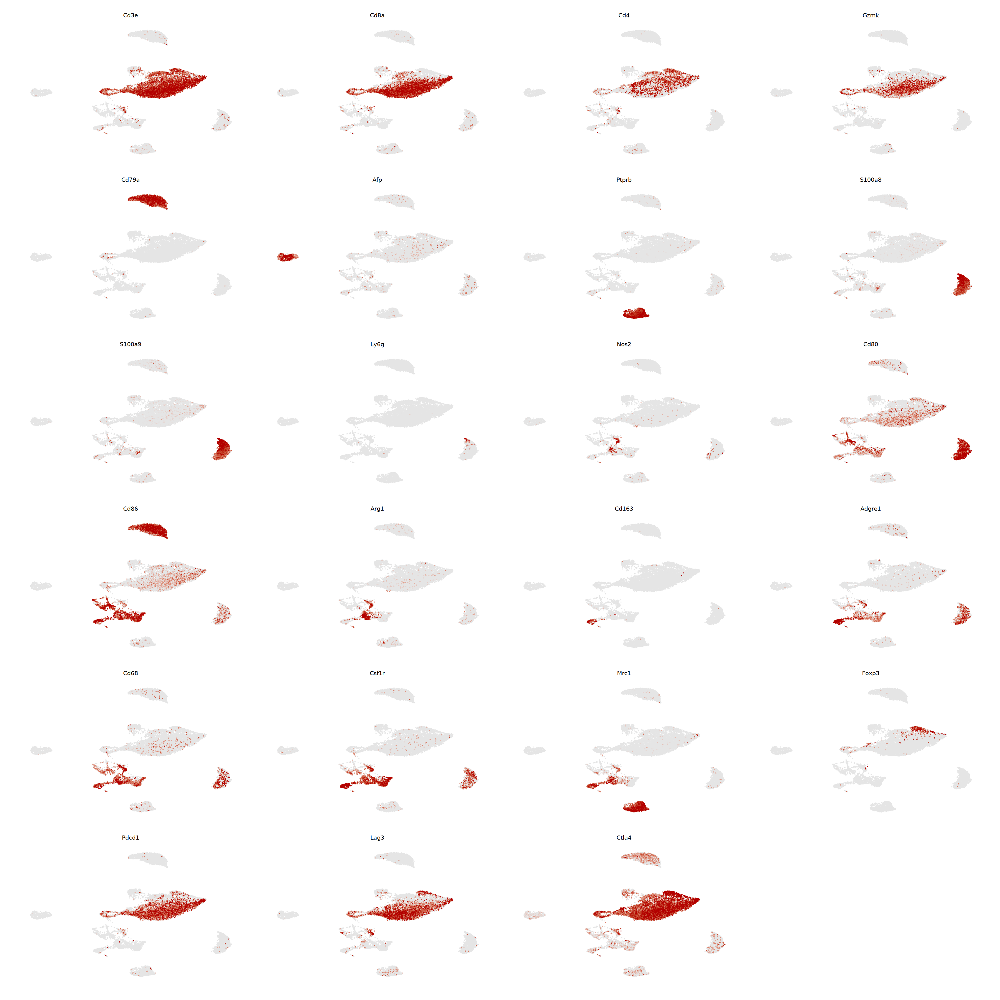

In [7]:
# 设置图形大小
options(repr.plot.width = 30, repr.plot.height = 30)

# 创建FeaturePlot
FeaturePlot(seu,
    features = c("Cd3e","Cd8a", "Cd4", "Gzmk", "Cd79a",  "Afp", "Ptprb", "S100a8", "S100a9", "Ly6g",
    "Nos2", "Cd80", "Cd86","Arg1", "Cd163","Adgre1", "Cd68", "Csf1r", "Mrc1","Foxp3","Pdcd1","Lag3","Ctla4"),
    ncol = 4,
    pt.size = 0.1,
    order = TRUE,
    reduction = "umap",
    cols = c("grey90", "#B30000"),
    min.cutoff = "q10",
    max.cutoff = "q90"
) &
theme_minimal() &
theme(
    plot.title = element_text(size = 12, face = "bold", hjust = 0.5),  # 标题居中
    strip.text = element_text(size = 12, face = "bold", hjust = 0.5),  # 分面标题居中
    axis.title = element_blank(),    # 移除轴标题
    axis.text = element_blank(),     # 移除轴文本
    axis.ticks = element_blank(),    # 移除轴刻度线
    legend.position = "none",        # 移除图例
    panel.grid.major = element_blank(),
    panel.grid.minor = element_blank(),
    plot.margin = margin(0.5, 0.5, 0.5, 0.5, "cm")
)

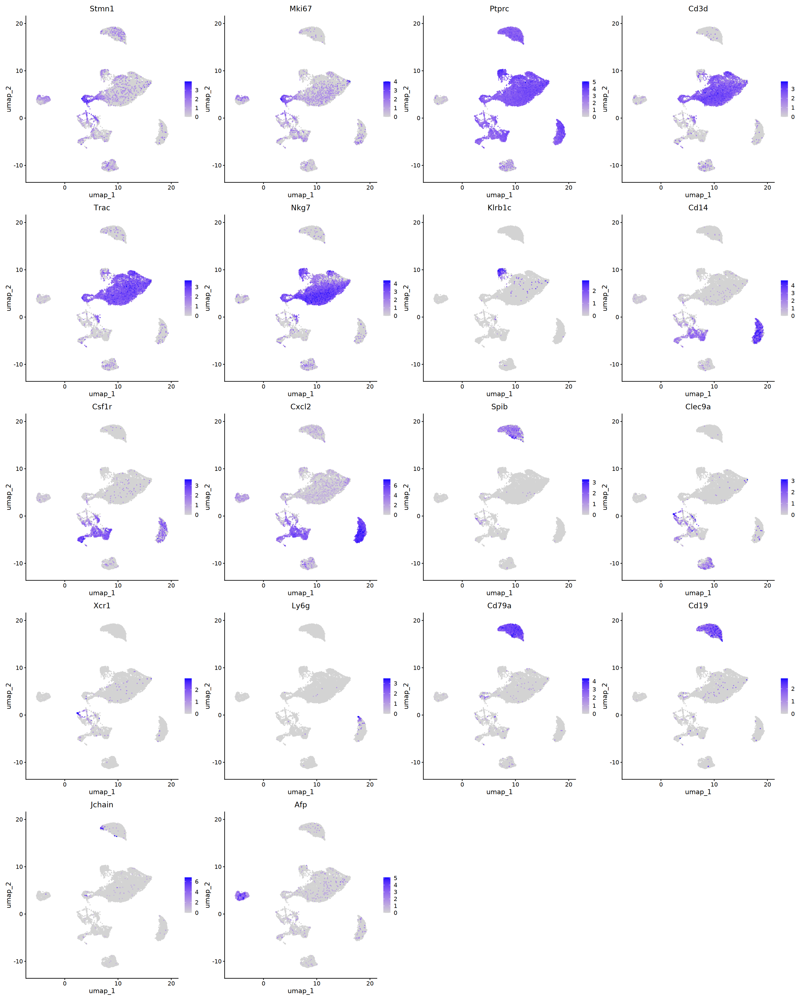

In [9]:
options(repr.plot.width=6*4, repr.plot.height=6*5,repe.plot.resolution=300)
FeaturePlot(seu, ncol=4, order = TRUE,
            features = c("Stmn1","Mki67","Ptprc","Cd3d","Trac","Nkg7","Klrb1c","Cd14","Csf1r","Cxcl2","Spib","Clec9a","Xcr1","Ly6g","Cd79a","Cd19","Jchain","Afp"))

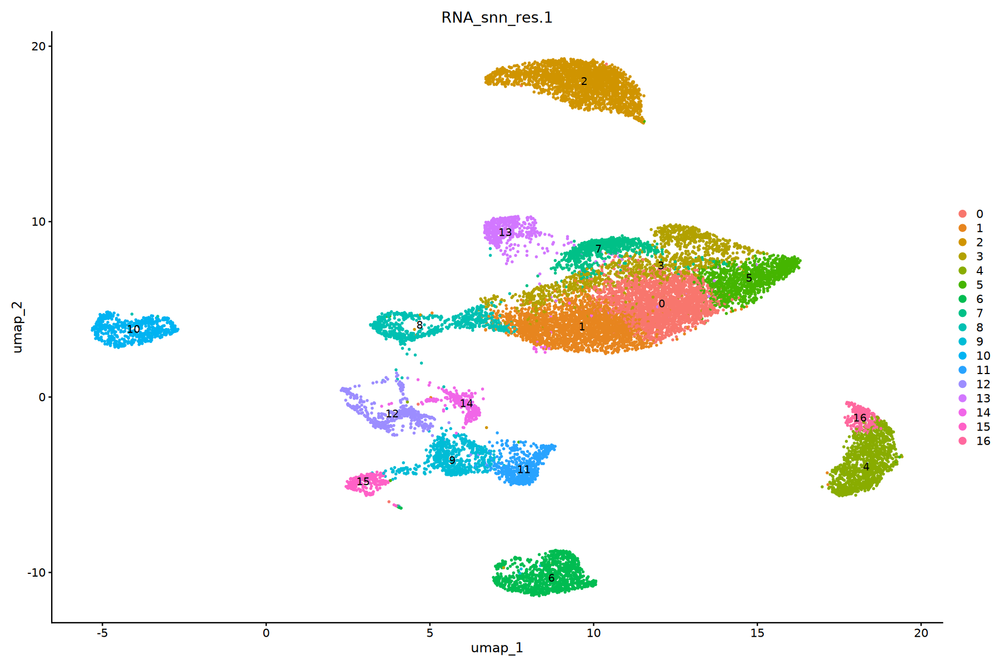

In [11]:
cluster_col <- "RNA_snn_res.1"
options(repr.plot.width = 15, repr.plot.height = 10)
DimPlot(seu,
        reduction = "umap",
        group.by = cluster_col,
        label = TRUE,
        label.size = 4,
        pt.size = 0.5)

In [ ]:
library(writexl)
output_path <- "/data3/Group8/gonglihao/1-MMP9/2-Harmony"
cluster_col <- "RNA_snn_res.1"
seu <- JoinLayers(seu)
Idents(seu) <- cluster_col

cosg_markers <- cosg(
   seu,
   groups = 'all',
   mu = 1
)

avg_expr <- AggregateExpression(
   seu,
   group.by = cluster_col,
   assays = "RNA"
)$RNA

cluster_vec <- rep(names(cosg_markers$names), sapply(cosg_markers$names, length))
genes_vec <- unlist(cosg_markers$names)
scores_vec <- unlist(cosg_markers$scores)

cosg_results_df <- data.frame(
   cluster = cluster_vec,
   Gene = genes_vec,
   Score = scores_vec,
   stringsAsFactors = FALSE
)

cluster_names <- paste0("g", cosg_results_df$cluster)
cosg_results_df$Avg_Expression <- NA

genes_match <- match(cosg_results_df$Gene, rownames(avg_expr))
clusters_match <- match(cluster_names, colnames(avg_expr))
valid_indices <- !is.na(genes_match) & !is.na(clusters_match)
cosg_results_df$Avg_Expression[valid_indices] <- round(
   avg_expr[cbind(
       genes_match[valid_indices], 
       clusters_match[valid_indices]
   )],
   3
)

cosg_results_df$cluster <- as.numeric(cosg_results_df$cluster)
cosg_results_df <- cosg_results_df[order(cosg_results_df$cluster, -cosg_results_df$Score),]

excel_data <- split(cosg_results_df, cosg_results_df$cluster)
excel_data <- lapply(excel_data, function(x) {
   x <- x[order(-x$Score),]
   x$cluster <- NULL
   return(x)
})
names(excel_data) <- paste0("Cluster", names(excel_data))

resolution <- sub(".*res\\.", "", cluster_col)

excel_filename <- paste0("sh-nc-cosg_markers-", resolution, ".xlsx")
csv_filename <- paste0("sh-nc-cosg_markers-", resolution, ".csv")

write_xlsx(excel_data, path = file.path(output_path, excel_filename))
data.table::fwrite(cosg_results_df, file = file.path(output_path, csv_filename))

In [16]:
head(seu@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,RNA_snn_res.0.1,RNA_snn_res.0.2,RNA_snn_res.0.3,RNA_snn_res.0.4,RNA_snn_res.0.5,seurat_clusters,⋯,pred.immgen.finepruned,pred.immgen.main,pred.immgen.mainpruned,RNA_snn_res.0.6,RNA_snn_res.0.7,RNA_snn_res.0.8,RNA_snn_res.0.9,RNA_snn_res.1,RNA_snn_res.1.1,RNA_snn_res.1.2
,<chr>,<dbl>,<int>,<dbl>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,⋯,<chr>,<chr>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
NC_AAACCCAAGGGAGGAC-1,shNC,4349,2013,2.299379,0,0,0,3,6,3,⋯,T cells (T.4MEM44H62L),NKT,NKT,5,5,6,4,3,3,3
NC_AAACCCAAGGGCGAAG-1,shNC,3739,1970,4.573415,0,0,0,0,0,0,⋯,NKT (NKT.4+),NKT,NKT,0,0,0,0,0,0,0
NC_AAACCCACAAAGTATG-1,shNC,7575,2469,2.297030,1,3,3,5,4,9,⋯,Monocytes (MO.6+2+),Monocytes,Monocytes,9,9,9,8,9,9,9
NC_AAACCCACAATGTCTG-1,shNC,4284,1874,2.614379,0,0,0,4,0,0,⋯,T cells (T.Tregs),NKT,NKT,0,0,0,0,0,4,0
NC_AAACCCACACTGGAAG-1,shNC,2926,1521,1.982228,0,0,0,3,0,3,⋯,NKT (NKT.4+),NKT,NKT,0,0,0,4,3,3,3
NC_AAACCCACATCCGAGC-1,shNC,5690,2142,3.919156,2,1,1,1,2,1,⋯,B cells (B.CD19CONTROL),B cells,B cells,2,2,2,2,2,2,1


In [17]:
saveRDS(seu, file = file.path(output_path, "seu.rds"))

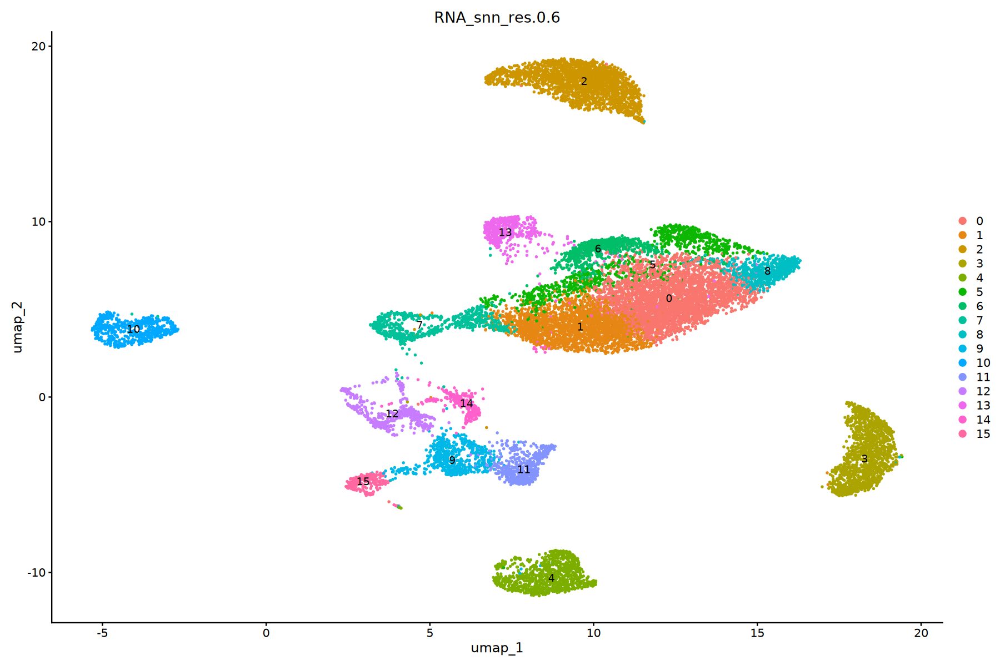

In [23]:
options(repr.plot.width = 15, repr.plot.height = 10)
DimPlot(sue,
        reduction = "umap",
        group.by = "RNA_snn_res.0.6",
        label = TRUE,
        label.size = 4,
        pt.size = 0.5)

In [24]:
required_columns <- c(
    "orig.ident",
    "nCount_RNA",      # RNA计数
    "nFeature_RNA",    # 基因数
"RNA_snn_res.0.6" 
)

seu@meta.data <- seu@meta.data[, required_columns]

,orig.ident,nCount_RNA,nFeature_RNA,RNA_snn_res.0.6
,<chr>,<dbl>,<int>,<fct>
NC_AAACCCAAGGGAGGAC-1,shNC,4349,2013,5
NC_AAACCCAAGGGCGAAG-1,shNC,3739,1970,0
NC_AAACCCACAAAGTATG-1,shNC,7575,2469,9
NC_AAACCCACAATGTCTG-1,shNC,4284,1874,0
NC_AAACCCACACTGGAAG-1,shNC,2926,1521,0
NC_AAACCCACATCCGAGC-1,shNC,5690,2142,2


In [25]:
saveRDS(seu, file = file.path(output_path, "combined-0.6.rds"))